#IMPORT LIBRARIES

In [ ]:
#importing

import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score
!pip install keras
import tensorflow as tf
from keras.utils import normalize
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import MaxPool2D
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Dropout
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Activation
from PIL import Image

#IMPORT DATASET

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
#load dataset

path = os.listdir('/content/drive/MyDrive/Brain Tumor Dataset1')
classes = {'no_tumor':0, 'pituitary_tumor':1, 'meningioma_tumor':2, 'glioma_tumor':3}

#READ DATASET AND MAKE ARRAY

In [ ]:
#read dataset

import cv2
X = []
Y = []
for cls in classes:
   path = '/content/drive/MyDrive/Brain Tumor Dataset1/Training Dataset/'+cls
   for j in os.listdir(path):
    img = cv2.imread(path+'/'+j, 0 )
    #img = Image.fromarray(img, 'RGB')
    #img = Image.resize(64,64)
    img = cv2.resize(img,(300,300))
    X.append(img)
    Y.append(classes[cls])

#MAKE NUMPY ARRAY

In [ ]:
#array

X = np.array(X)
Y = np.array(Y)

X = X / 255.0
X_updated = X.reshape(len(X), -1)

In [ ]:
#getting count of images

pd.Series(Y).value_counts()


1    827
3    826
2    822
0    395
dtype: int64

<function matplotlib.pyplot.show(close=None, block=None)>

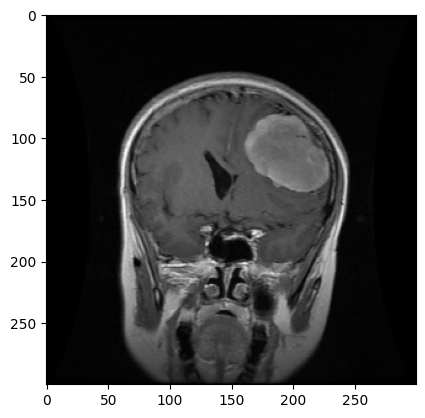

In [ ]:
#show one image (GRAY)

import matplotlib.pyplot as plt

plt.imshow(X[1800], cmap='gray')
plt.show

#SPLIT THE DATA AND BUILD CNN MODEL AND TRAIN THE MODEL

In [ ]:
# Split the data into training and testing sets
import tensorflow as tf
from tensorflow.keras import layers

from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

input_shape = (300, 300, 1)

x_train, x_test, y_train, y_test = train_test_split(X, Y)

# Define the CNN model architecture
model = tf.keras.Sequential([
    layers.Conv2D(32, kernel_size=(3, 3), activation='relu', input_shape=input_shape),
    layers.MaxPooling2D(pool_size=(2, 2)),
    layers.Dropout(0.25),  # Dropout layer with dropout rate of 0.25
    layers.Conv2D(64, kernel_size=(3, 3), activation='relu'),
    layers.MaxPooling2D(pool_size=(2, 2)),
    layers.Dropout(0.25),  # Dropout layer with dropout rate of 0.25
    layers.Flatten(),
    layers.Dense(128, activation='relu'),
    layers.Dropout(0.5),  # Dropout layer with dropout rate of 0.5
    layers.Dense(len(classes), activation='softmax')
])

In [ ]:
# Compile the model
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [ ]:
# Train the model
model.fit(x_train, y_train, epochs=10, batch_size=50, validation_data=(x_test, y_test))

Epoch 1/10
44/44 [==============================] - 373s 8s/step - loss: 1.8188 - accuracy: 0.4419 - val_loss: 1.0147 - val_accuracy: 0.5822
Epoch 2/10
44/44 [==============================] - 339s 8s/step - loss: 0.9186 - accuracy: 0.6176 - val_loss: 0.7470 - val_accuracy: 0.7019
Epoch 3/10
44/44 [==============================] - 353s 8s/step - loss: 0.6729 - accuracy: 0.7323 - val_loss: 0.7935 - val_accuracy: 0.6170
Epoch 4/10
44/44 [==============================] - 353s 8s/step - loss: 0.5134 - accuracy: 0.7872 - val_loss: 0.4872 - val_accuracy: 0.8162
Epoch 5/10
44/44 [==============================] - 363s 8s/step - loss: 0.3741 - accuracy: 0.8536 - val_loss: 0.5336 - val_accuracy: 0.7563
Epoch 6/10
44/44 [==============================] - 358s 8s/step - loss: 0.2739 - accuracy: 0.8917 - val_loss: 0.4058 - val_accuracy: 0.8468
Epoch 7/10
44/44 [==============================] - 356s 8s/step - loss: 0.2331 - accuracy: 0.9117 - val_loss: 0.3925 - val_accuracy: 0.8482
Epoch 8/10
44

# SPLIT THE DATA AND BUILD FACTORIAL EXPERIMENTAL MODEL AND TRAIN IT

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score

'''
def load_data():
    # Load the brain tumor image dataset
    X = np.load('/content/drive/MyDrive/Brain Tumor Dataset1/Training Dataset')
    y = np.load('/content/drive/MyDrive/Brain Tumor Dataset1/Testing Dataset')

    return X, y
'''

def split_data(X, y):
    # Split the data into train and test sets
    X_train, X_test, y_train, y_test = train_test_split(X_updated, Y, test_size=0.25, random_state=42)

    return X_train, X_test, y_train, y_test


def train_model(X_train, y_train, factor_levels):
    # Create a logistic regression model
    model = LogisticRegression()

    # Train the model on the train set
    model.fit(X_train, y_train)

    return model


def evaluate_model(model, X_test, y_test):
    # Evaluate the model on the test set
    y_pred = model.predict(X_test)

    # Calculate the accuracy score
    accuracy = accuracy_score(y_test, y_pred)

    return accuracy


def perform_fed(X_train, y_train, factor_levels):
    # Create an empty list to store the results
    results = []

    # Iterate over all combinations of factor levels
    for factor_level in factor_levels:
        # Train the model on the train set with the current combination of factor levels
        model = train_model(X_train, y_train, factor_level)

        # Evaluate the model on the test set
        accuracy = evaluate_model(model, X_test, y_test)

        # Add the results to the list
        results.append((factor_level, accuracy))

    return results


# Load the brain tumor image dataset
#X, y = load_data()

# Split the data into train and test sets
X_train, X_test, y_train, y_test = split_data(X, Y)

# Define the factor levels
factor_levels = {
    'image_size': [64, 128, 256],
    'data_augmentation': [True, False],
    'regularization': [0.01, 0.1, 1.0]
}

# Perform FED
results = perform_fed(X_train, y_train, factor_levels)

# Print the results
for factor_level, accuracy in results:
    print('Factor level:', factor_level, 'Accuracy:', accuracy)


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _c

Factor level: image_size Accuracy: 0.7841225626740947
Factor level: data_augmentation Accuracy: 0.7841225626740947
Factor level: regularization Accuracy: 0.7841225626740947


In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score

'''
def load_data():
    # Load the brain tumor image dataset
    X = np.load('/content/drive/MyDrive/Brain Tumor Dataset1/Training Dataset')
    y = np.load('/content/drive/MyDrive/Brain Tumor Dataset1/Testing Dataset')

    return X, y
'''

def split_data(X, y):
    # Split the data into train and test sets
    X_train, X_test, y_train, y_test = train_test_split(X_updated, Y, test_size=0.25, random_state=42)

    return X_train, X_test, y_train, y_test


def train_model(X_train, y_train, factor_levels):
    # Create a logistic regression model
    model = SVC()


    # Train the model on the train set
    model.fit(X_train, y_train)

    return model


def evaluate_model(model, X_test, y_test):
    # Evaluate the model on the test set
    y_pred = model.predict(X_test)

    # Calculate the accuracy score
    accuracy = accuracy_score(y_test, y_pred)

    return accuracy


def perform_fed(X_train, y_train, factor_levels):
    # Create an empty list to store the results
    results = []

    # Iterate over all combinations of factor levels
    for factor_level in factor_levels:
        # Train the model on the train set with the current combination of factor levels
        model = train_model(X_train, y_train, factor_level)

        # Evaluate the model on the test set
        accuracy = evaluate_model(model, X_test, y_test)

        # Add the results to the list
        results.append((factor_level, accuracy))

    return results


# Load the brain tumor image dataset
#X, y = load_data()

# Split the data into train and test sets
X_train, X_test, y_train, y_test = split_data(X, Y)

# Define the factor levels
factor_levels = {
    'image_size': [32, 64, 128, 256],  # Add 32 as an additional image size level
    'data_augmentation': [True, False],
    'regularization': [0.01, 0.1, 1.0]
}

# Perform FED
results = perform_fed(X_train, y_train, factor_levels)

# Print the results
for factor_level, accuracy in results:
    print('Factor level:', factor_level, 'Accuracy:', accuracy)


Factor level: image_size Accuracy: 0.8105849582172702
Factor level: data_augmentation Accuracy: 0.8105849582172702
Factor level: regularization Accuracy: 0.8105849582172702


In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score

'''
def load_data():
    # Load the brain tumor image dataset
    X = np.load('/content/drive/MyDrive/Brain Tumor Dataset1/Training Dataset')
    y = np.load('/content/drive/MyDrive/Brain Tumor Dataset1/Testing Dataset')

    return X, y
'''

def split_data(X, y):
    # Split the data into train and test sets
    X_train, X_test, y_train, y_test = train_test_split(X_updated, Y, test_size=0.25, random_state=42)

    return X_train, X_test, y_train, y_test


def train_model(X_train, y_train, factor_levels):
    # Create a logistic regression model
    model = SVC()


    # Train the model on the train set
    model.fit(X_train, y_train)

    return model


def evaluate_model(model, X_test, y_test):
    # Evaluate the model on the test set
    y_pred = model.predict(X_test)

    # Calculate the accuracy score
    accuracy = accuracy_score(y_test, y_pred)

    return accuracy


def perform_fed(X_train, y_train, factor_levels):
    # Create an empty list to store the results
    results = []

    # Iterate over all combinations of factor levels
    for factor_level in factor_levels:
        # Train the model on the train set with the current combination of factor levels
        model = train_model(X_train, y_train, factor_level)

        # Evaluate the model on the test set
        accuracy = evaluate_model(model, X_test, y_test)

        # Add the results to the list
        results.append((factor_level, accuracy))

    return results


# Load the brain tumor image dataset
#X, y = load_data()

# Split the data into train and test sets
X_train, X_test, y_train, y_test = split_data(X, Y)

# Define the factor levels
factor_levels = {
  'image_size': [32, 64, 128, 256],
  'data_augmentation': [True, False],
  'regularization': [0.01, 0.05, 0.1, 0.5, 1.0]
}


# Perform FED
results = perform_fed(X_train, y_train, factor_levels)

# Print the results
for factor_level, accuracy in results:
    print('Factor level:', factor_level, 'Accuracy:', accuracy)


Factor level: image_size Accuracy: 0.8105849582172702
Factor level: data_augmentation Accuracy: 0.8105849582172702
Factor level: regularization Accuracy: 0.8105849582172702


In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score

def load_data():
  # Load the brain tumor image dataset
  X = np.load('/content/drive/MyDrive/Brain Tumor Dataset1/Training Dataset')
  Y = np.load('/content/drive/MyDrive/Brain Tumor Dataset1/Testing Dataset')

  return X, Y

def split_data(X, Y):
  # Split the data into train and test sets
  X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.25, random_state=42)

  return X_train, X_test, Y_train, Y_test

def train_model(X_train, Y_train, factor_level):
  # Create an SVM model
  model = SVC(kernel='rbf')

  # Train the model on the train set with the current combination of factor levels
  model.fit(X_train, Y_train)

  return model

def evaluate_model(model, X_test, Y_test):
  # Evaluate the model on the test set
  Y_pred = model.predict(X_test)

  # Calculate the accuracy score
  accuracy = accuracy_score(Y_test, Y_pred)

  return accuracy

def perform_fed(X_train, Y_train, factor_levels):
  # Create an empty list to store the results
  results = []

  # Iterate over all combinations of factor levels
  for factor_level in factor_levels:
    # Train the model on the train set with the current combination of factor levels
    model = train_model(X_train, Y_train, factor_level)

    # Evaluate the model on the test set
    accuracy = evaluate_model(model, X_test, Y_test)

    # Add the results to the list
    results.append((factor_level, accuracy))

  return results

# Load the brain tumor image dataset
X, Y = load_data()

# Split the data into train and test sets
X_train, X_test, Y_train, Y_test = split_data(X, Y)

# Define the factor levels
factor_levels = {
  'kernel': ['rbf', 'linear', 'poly'],
  'C': [0.1, 1, 10],
  'gamma': ['scale', 'auto']
}

# Perform FED
results = perform_fed(X_train, Y_train, factor_levels)

# Print the results
for factor_level, accuracy in results:
  print('Factor level:', factor_level, 'Accuracy:', accuracy)


<function matplotlib.pyplot.show(close=None, block=None)>

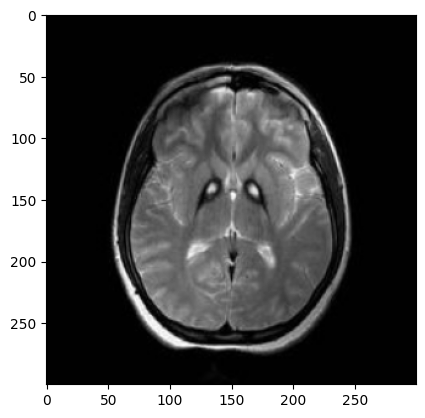

In [ ]:
import matplotlib.pyplot as plt

image1= plt.imshow(x_test[18], cmap='gray')
plt.show

#OUTPUT


1/1 [==============================] - 0s 115ms/step
Predicted class: meningioma_tumor
------------------------


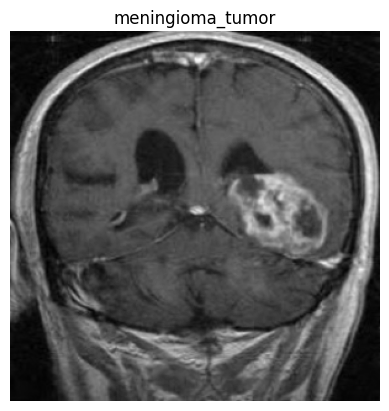

1/1 [==============================] - 0s 152ms/step
Predicted class: meningioma_tumor
------------------------


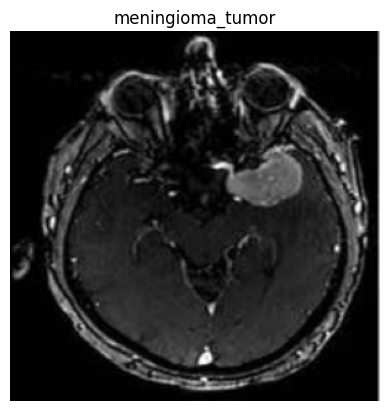

1/1 [==============================] - 0s 146ms/step
Predicted class: meningioma_tumor
------------------------


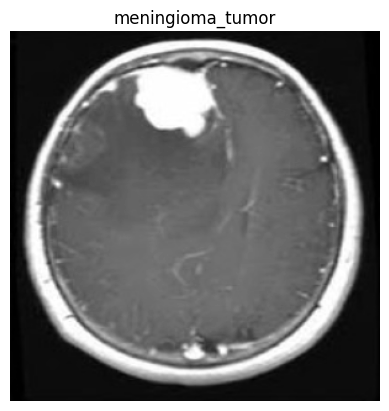

1/1 [==============================] - 0s 132ms/step
Predicted class: meningioma_tumor
------------------------


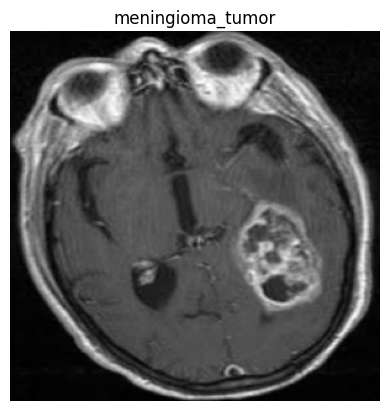

1/1 [==============================] - 0s 132ms/step
Predicted class: no_tumor
------------------------


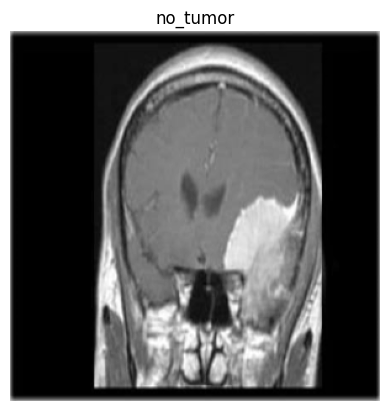

1/1 [==============================] - 0s 98ms/step
Predicted class: meningioma_tumor
------------------------


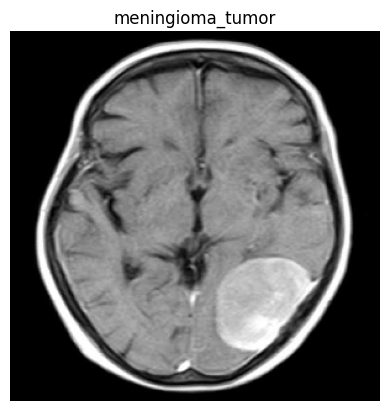

1/1 [==============================] - 0s 158ms/step
Predicted class: meningioma_tumor
------------------------


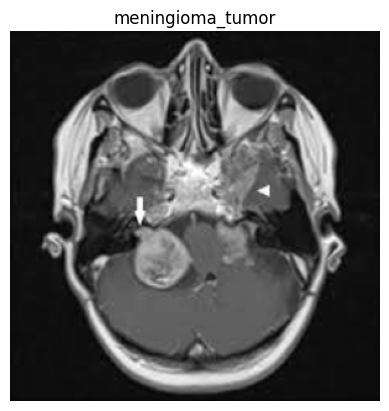

1/1 [==============================] - 0s 139ms/step
Predicted class: no_tumor
------------------------


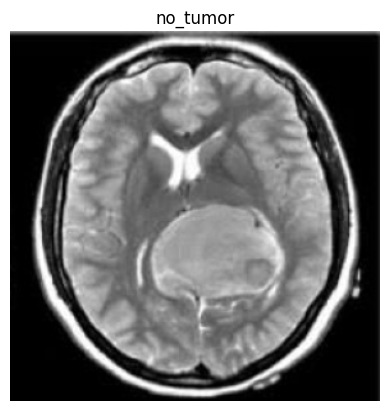

1/1 [==============================] - 0s 117ms/step
Predicted class: meningioma_tumor
------------------------


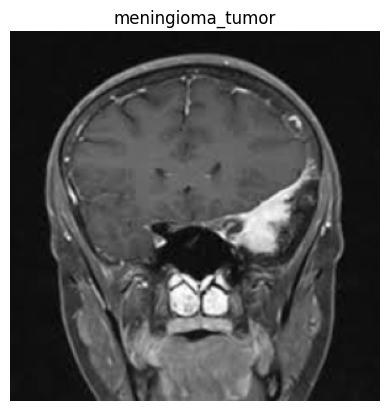

1/1 [==============================] - 0s 117ms/step
Predicted class: meningioma_tumor
------------------------


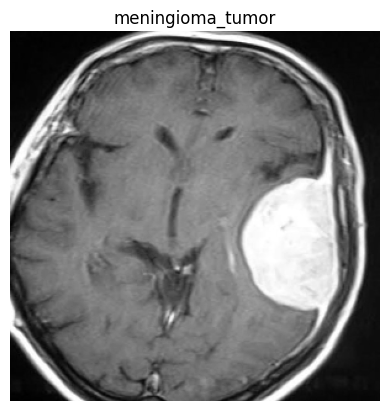

1/1 [==============================] - 0s 119ms/step
Predicted class: meningioma_tumor
------------------------


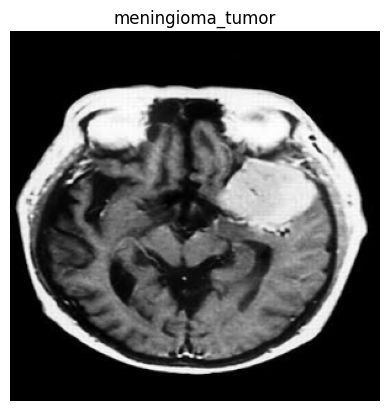

1/1 [==============================] - 0s 121ms/step
Predicted class: meningioma_tumor
------------------------


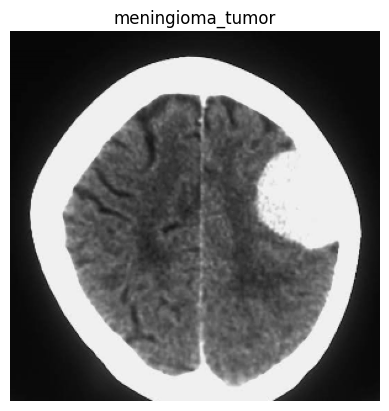

1/1 [==============================] - 0s 110ms/step
Predicted class: meningioma_tumor
------------------------


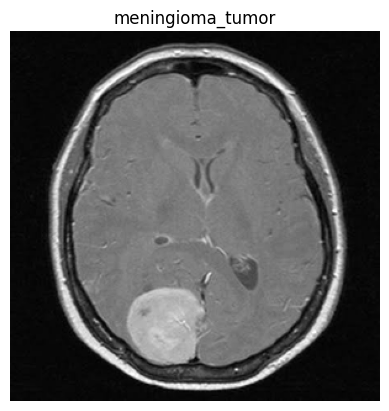

1/1 [==============================] - 0s 141ms/step
Predicted class: meningioma_tumor
------------------------


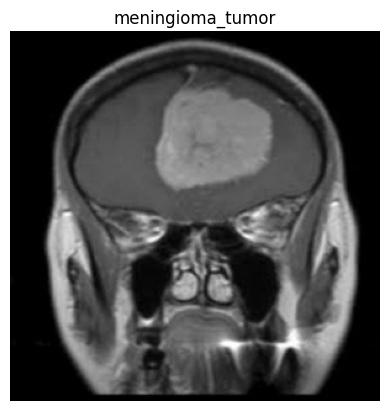

1/1 [==============================] - 0s 123ms/step
Predicted class: meningioma_tumor
------------------------


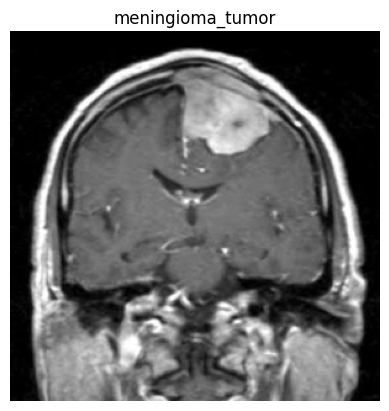

1/1 [==============================] - 0s 120ms/step
Predicted class: meningioma_tumor
------------------------


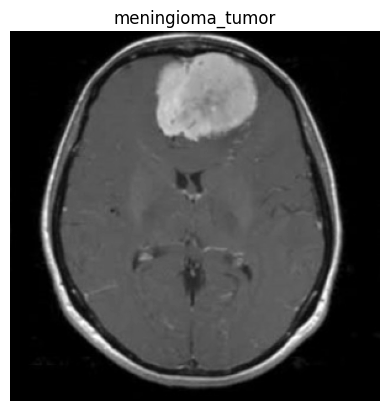

1/1 [==============================] - 0s 75ms/step
Predicted class: meningioma_tumor
------------------------


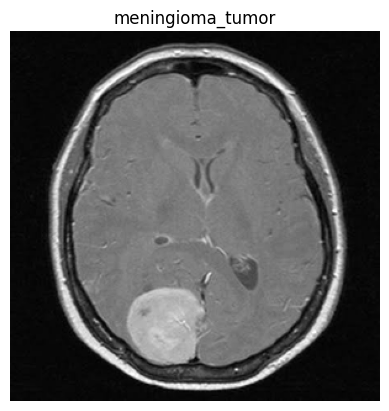

1/1 [==============================] - 0s 76ms/step
Predicted class: meningioma_tumor
------------------------


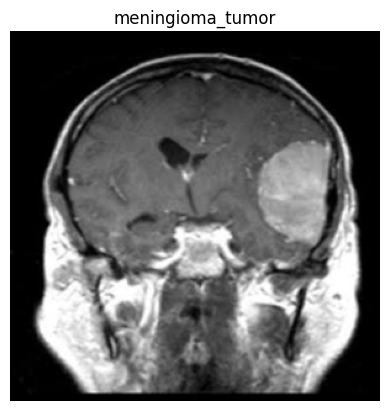

1/1 [==============================] - 0s 86ms/step
Predicted class: meningioma_tumor
------------------------


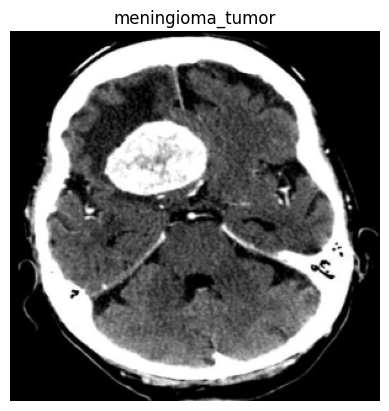

1/1 [==============================] - 0s 74ms/step
Predicted class: meningioma_tumor
------------------------


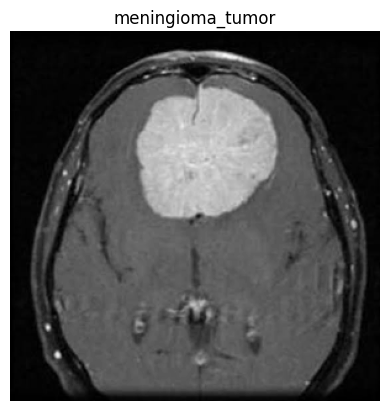

1/1 [==============================] - 0s 90ms/step
Predicted class: meningioma_tumor
------------------------


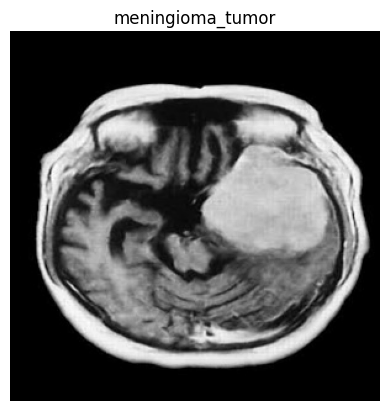

1/1 [==============================] - 0s 75ms/step
Predicted class: meningioma_tumor
------------------------


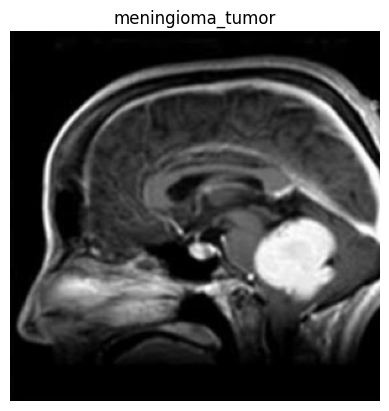

1/1 [==============================] - 0s 75ms/step
Predicted class: meningioma_tumor
------------------------


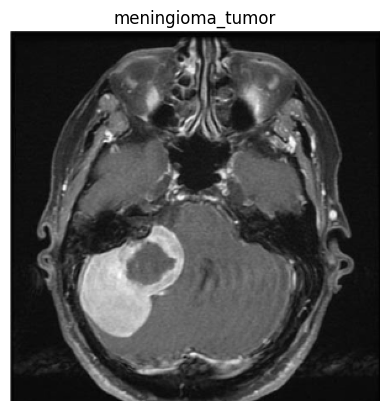

1/1 [==============================] - 0s 82ms/step
Predicted class: meningioma_tumor
------------------------


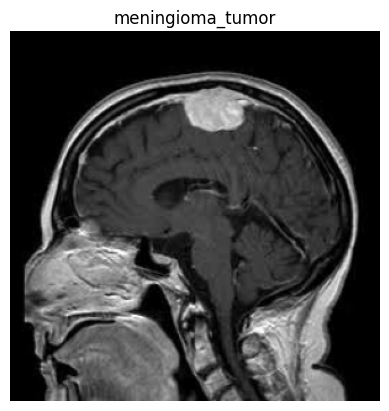

1/1 [==============================] - 0s 79ms/step
Predicted class: meningioma_tumor
------------------------


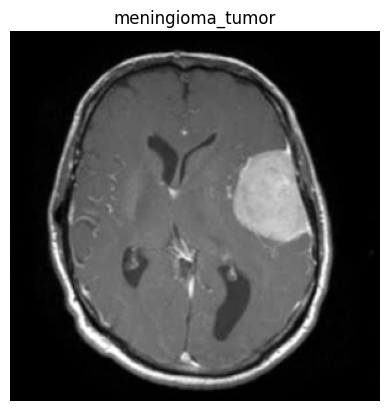

1/1 [==============================] - 0s 74ms/step
Predicted class: meningioma_tumor
------------------------


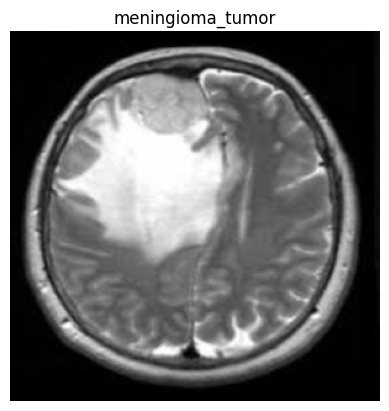

1/1 [==============================] - 0s 86ms/step
Predicted class: no_tumor
------------------------


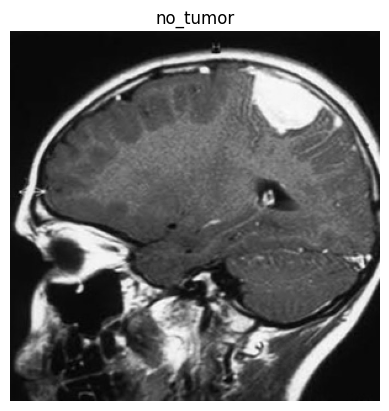

1/1 [==============================] - 0s 76ms/step
Predicted class: meningioma_tumor
------------------------


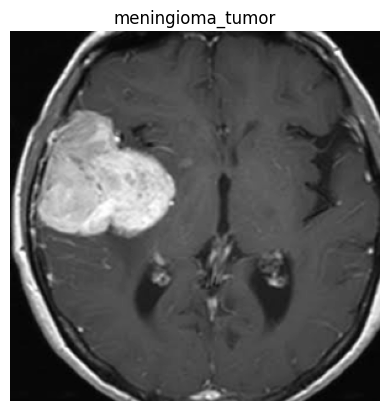

1/1 [==============================] - 0s 80ms/step
Predicted class: meningioma_tumor
------------------------


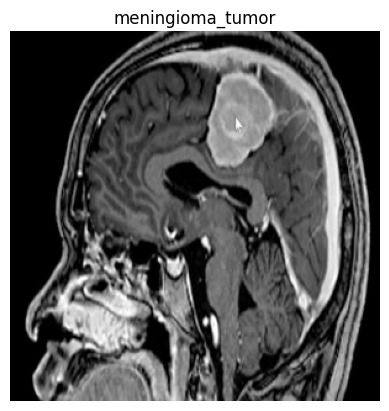

1/1 [==============================] - 0s 81ms/step
Predicted class: meningioma_tumor
------------------------


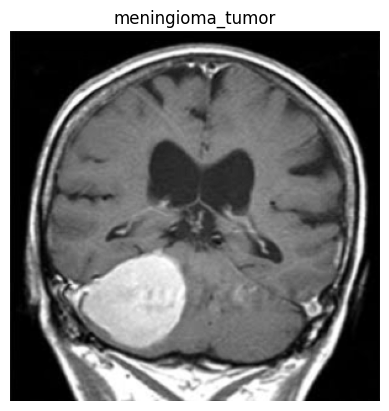

1/1 [==============================] - 0s 93ms/step
Predicted class: meningioma_tumor
------------------------


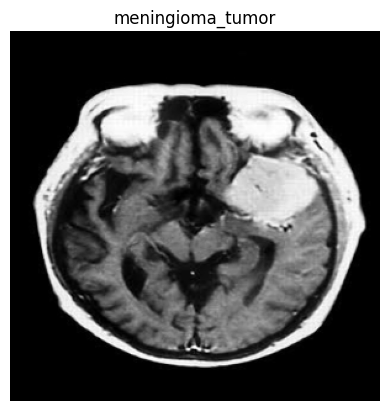

1/1 [==============================] - 0s 89ms/step
Predicted class: meningioma_tumor
------------------------


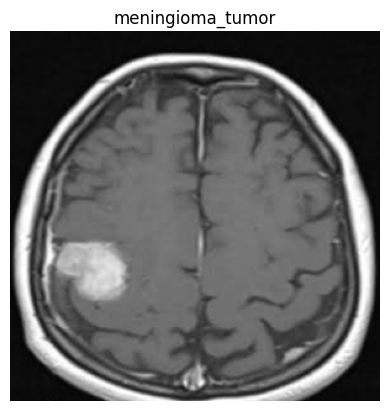

1/1 [==============================] - 0s 113ms/step
Predicted class: meningioma_tumor
------------------------


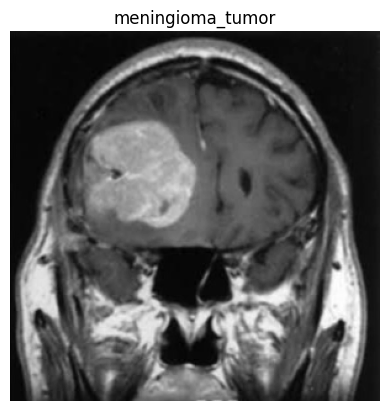

1/1 [==============================] - 0s 78ms/step
Predicted class: meningioma_tumor
------------------------


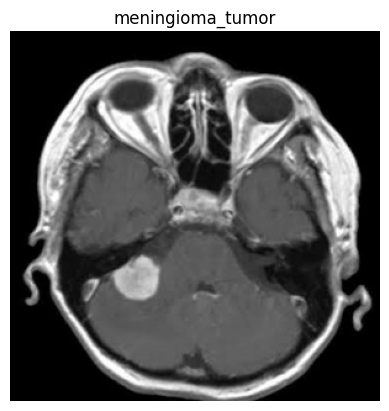

1/1 [==============================] - 0s 98ms/step
Predicted class: meningioma_tumor
------------------------


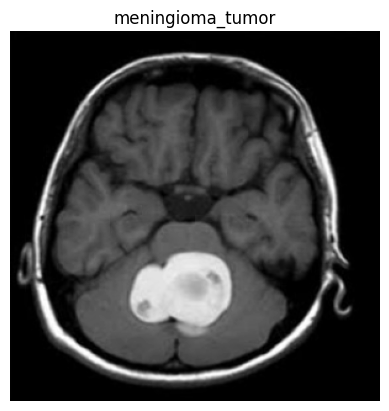

1/1 [==============================] - 0s 94ms/step
Predicted class: pituitary_tumor
------------------------


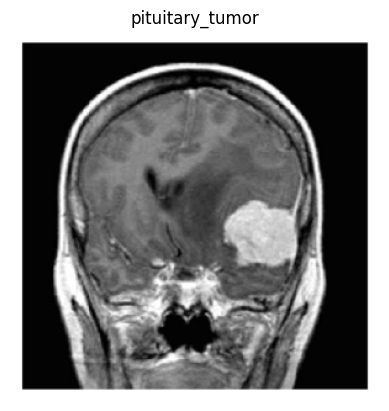

1/1 [==============================] - 0s 81ms/step
Predicted class: meningioma_tumor
------------------------


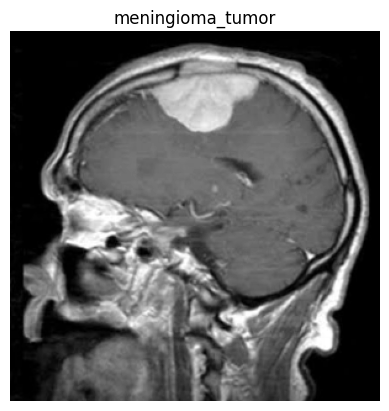

1/1 [==============================] - 0s 99ms/step
Predicted class: glioma_tumor
------------------------


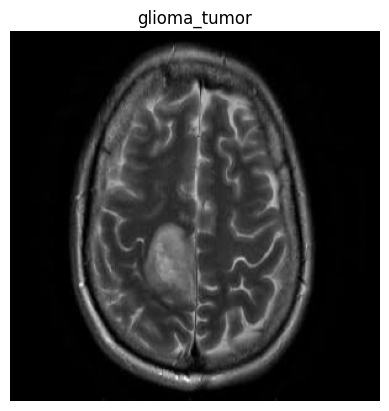

1/1 [==============================] - 0s 94ms/step
Predicted class: meningioma_tumor
------------------------


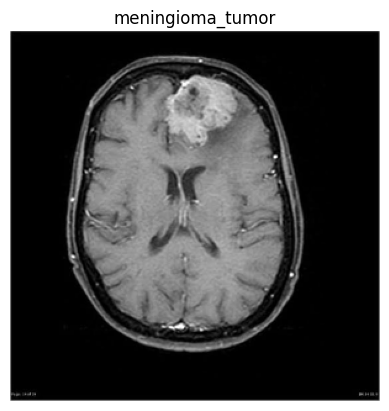

1/1 [==============================] - 0s 85ms/step
Predicted class: meningioma_tumor
------------------------


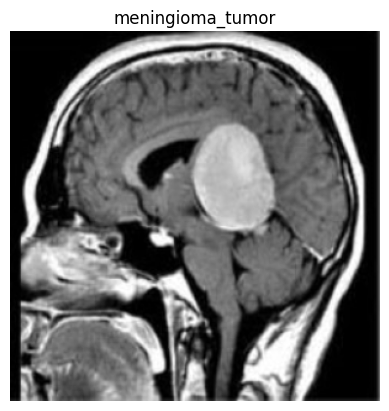

1/1 [==============================] - 0s 126ms/step
Predicted class: meningioma_tumor
------------------------


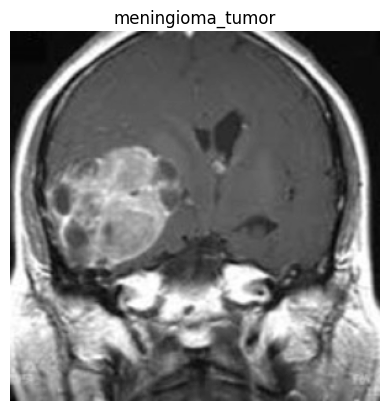

1/1 [==============================] - 0s 115ms/step
Predicted class: meningioma_tumor
------------------------


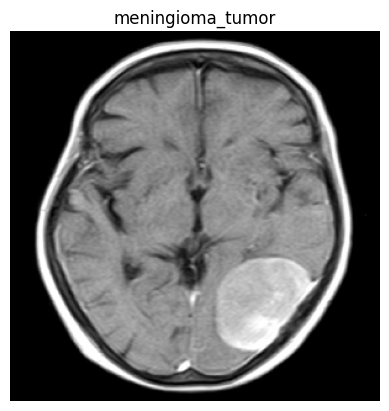

1/1 [==============================] - 0s 184ms/step
Predicted class: meningioma_tumor
------------------------


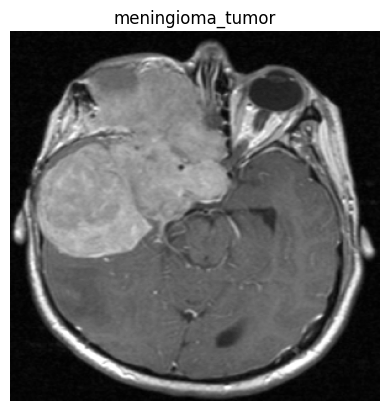

1/1 [==============================] - 0s 117ms/step
Predicted class: meningioma_tumor
------------------------


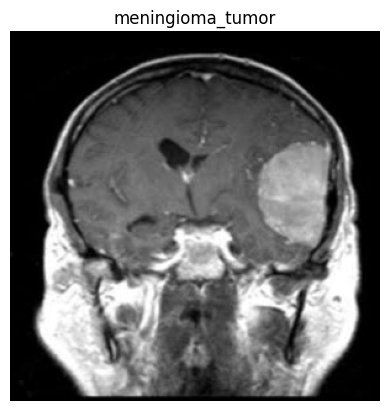

1/1 [==============================] - 0s 200ms/step
Predicted class: pituitary_tumor
------------------------


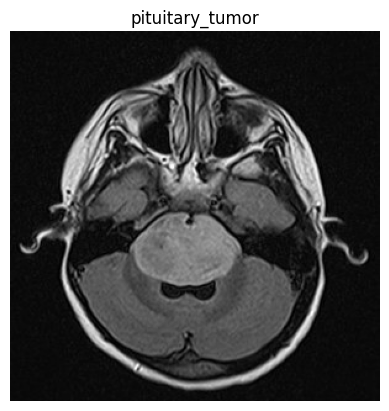

1/1 [==============================] - 0s 189ms/step
Predicted class: meningioma_tumor
------------------------


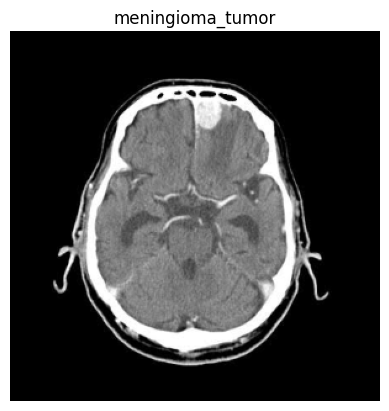

1/1 [==============================] - 0s 119ms/step
Predicted class: meningioma_tumor
------------------------


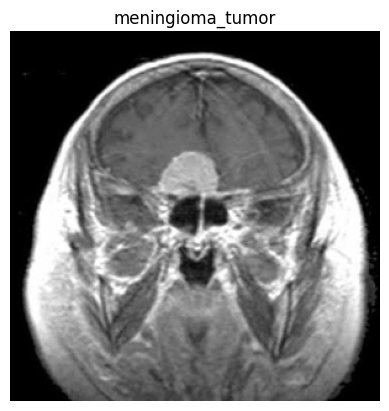

1/1 [==============================] - 0s 120ms/step
Predicted class: meningioma_tumor
------------------------


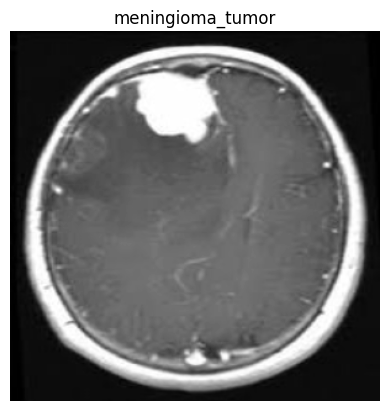

1/1 [==============================] - 0s 197ms/step
Predicted class: pituitary_tumor
------------------------


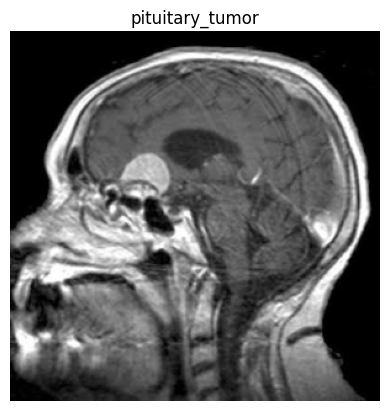

1/1 [==============================] - 0s 162ms/step
Predicted class: meningioma_tumor
------------------------


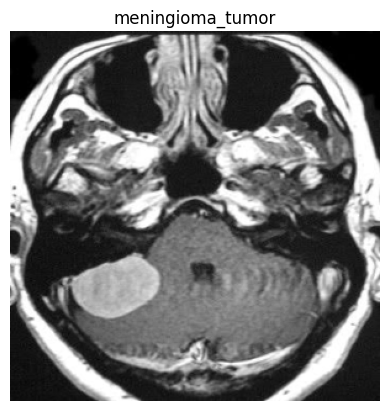

1/1 [==============================] - 0s 147ms/step
Predicted class: no_tumor
------------------------


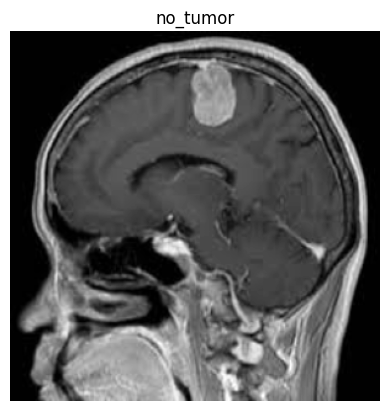

1/1 [==============================] - 0s 126ms/step
Predicted class: meningioma_tumor
------------------------


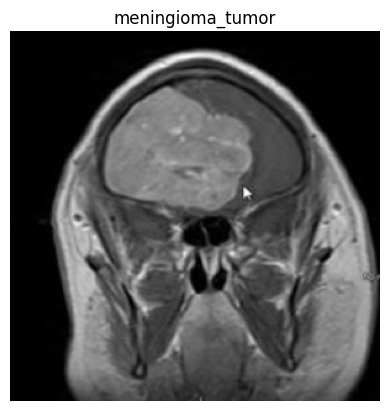

1/1 [==============================] - 0s 188ms/step
Predicted class: meningioma_tumor
------------------------


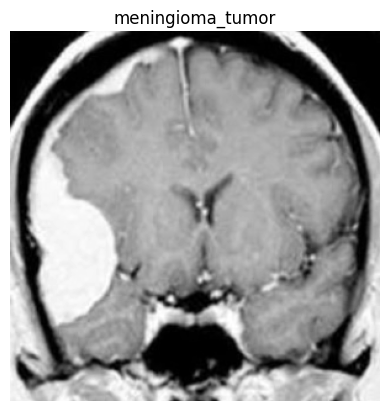

1/1 [==============================] - 0s 116ms/step
Predicted class: meningioma_tumor
------------------------


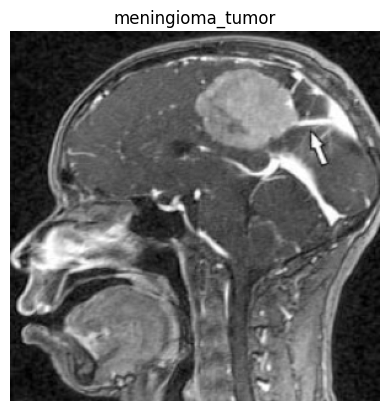

1/1 [==============================] - 0s 104ms/step
Predicted class: no_tumor
------------------------


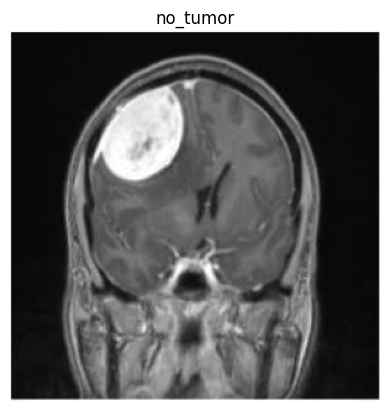

1/1 [==============================] - 0s 112ms/step
Predicted class: meningioma_tumor
------------------------


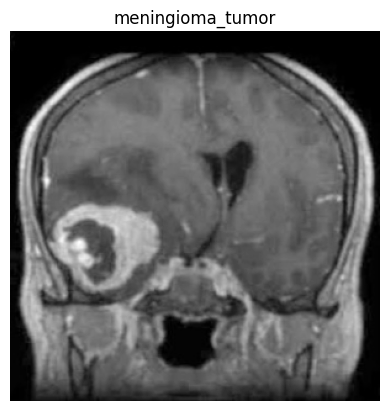

1/1 [==============================] - 0s 122ms/step
Predicted class: meningioma_tumor
------------------------


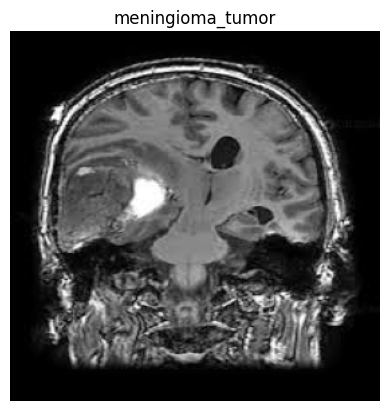

1/1 [==============================] - 0s 113ms/step
Predicted class: meningioma_tumor
------------------------


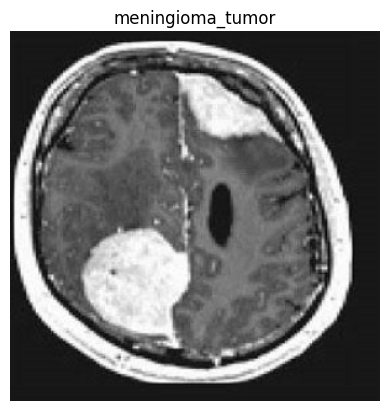

1/1 [==============================] - 0s 135ms/step
Predicted class: pituitary_tumor
------------------------


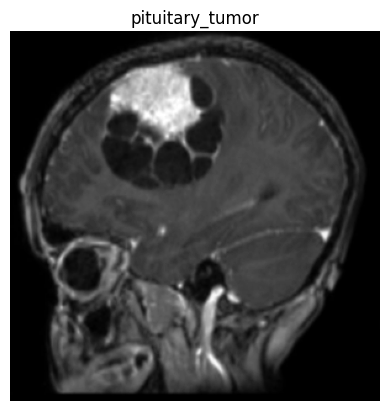

1/1 [==============================] - 0s 117ms/step
Predicted class: pituitary_tumor
------------------------


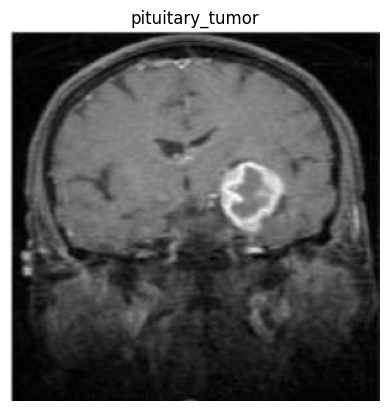

1/1 [==============================] - 0s 126ms/step
Predicted class: meningioma_tumor
------------------------


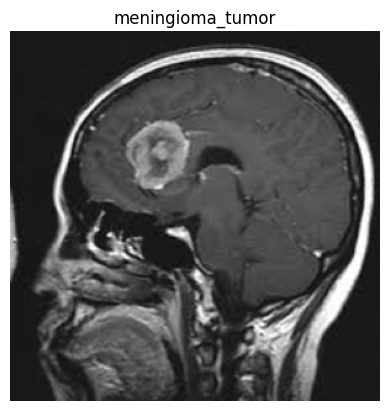

1/1 [==============================] - 0s 81ms/step
Predicted class: meningioma_tumor
------------------------


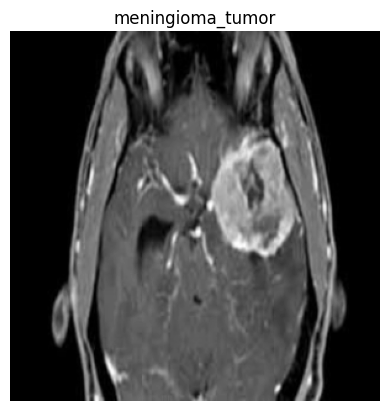

1/1 [==============================] - 0s 129ms/step
Predicted class: meningioma_tumor
------------------------


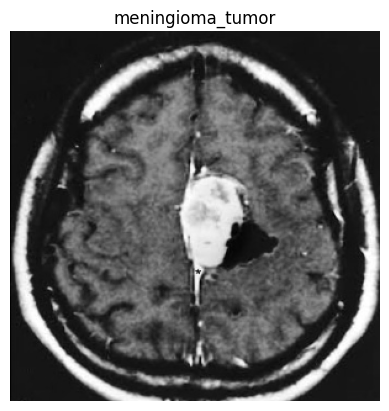

1/1 [==============================] - 0s 113ms/step
Predicted class: no_tumor
------------------------


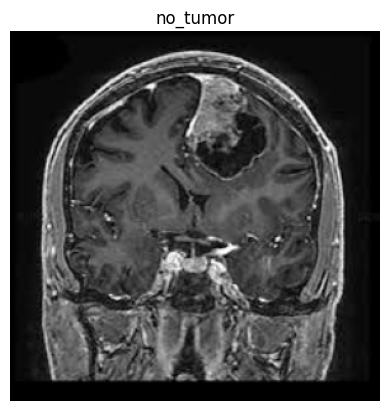

1/1 [==============================] - 0s 128ms/step
Predicted class: meningioma_tumor
------------------------


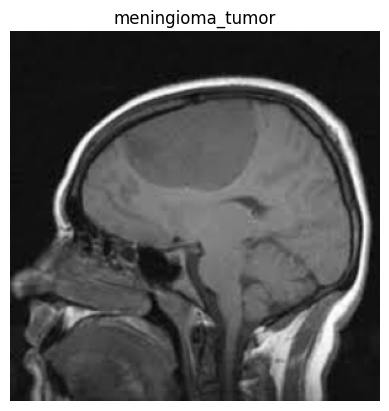

1/1 [==============================] - 0s 121ms/step
Predicted class: meningioma_tumor
------------------------


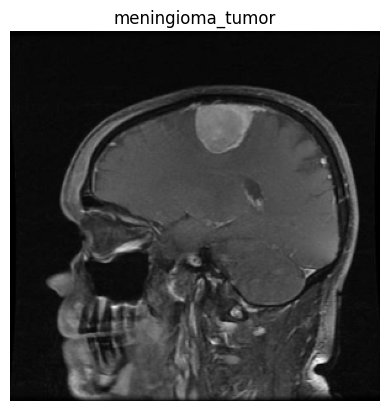

1/1 [==============================] - 0s 109ms/step
Predicted class: meningioma_tumor
------------------------


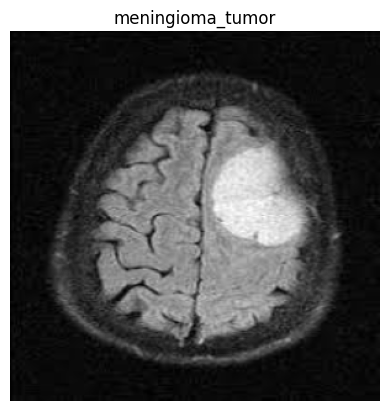

1/1 [==============================] - 0s 117ms/step
Predicted class: meningioma_tumor
------------------------


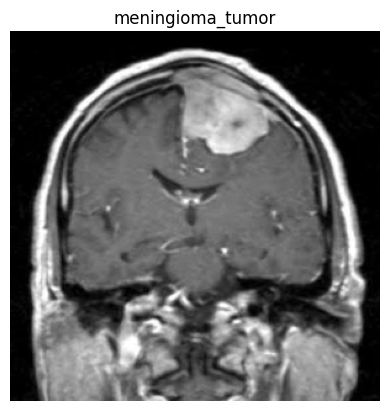

1/1 [==============================] - 0s 116ms/step
Predicted class: meningioma_tumor
------------------------


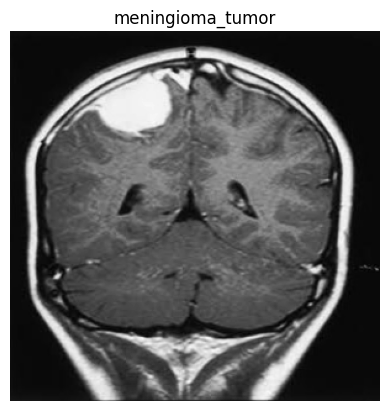

1/1 [==============================] - 0s 138ms/step
Predicted class: meningioma_tumor
------------------------


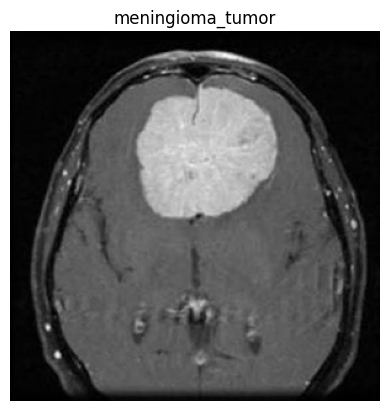

1/1 [==============================] - 0s 128ms/step
Predicted class: meningioma_tumor
------------------------


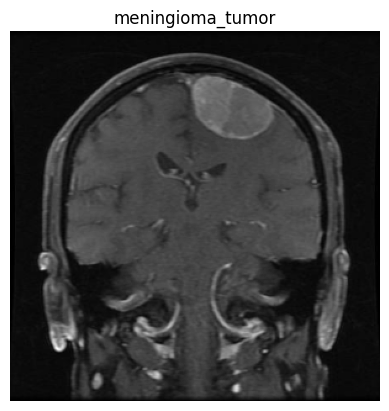

1/1 [==============================] - 0s 124ms/step
Predicted class: meningioma_tumor
------------------------


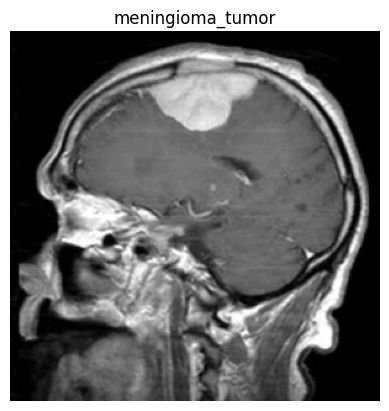

1/1 [==============================] - 0s 160ms/step
Predicted class: meningioma_tumor
------------------------


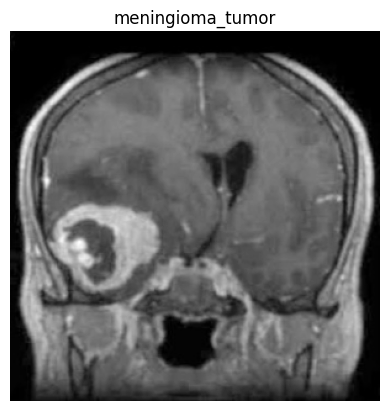

1/1 [==============================] - 0s 168ms/step
Predicted class: meningioma_tumor
------------------------


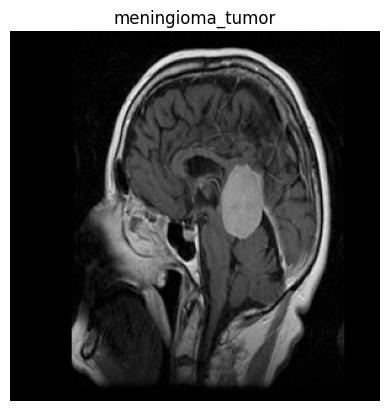

1/1 [==============================] - 1s 606ms/step
Predicted class: meningioma_tumor
------------------------


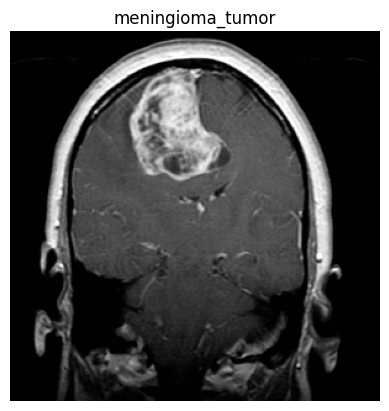

1/1 [==============================] - 0s 197ms/step
Predicted class: meningioma_tumor
------------------------


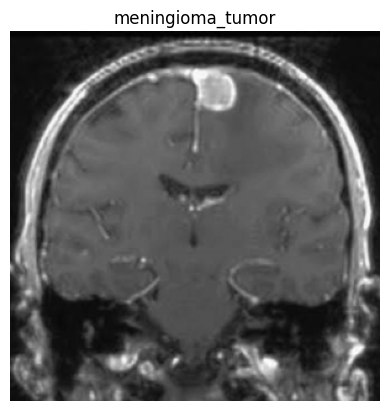

1/1 [==============================] - 0s 167ms/step
Predicted class: meningioma_tumor
------------------------


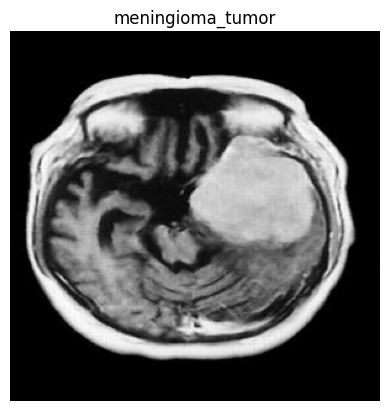

1/1 [==============================] - 0s 156ms/step
Predicted class: meningioma_tumor
------------------------


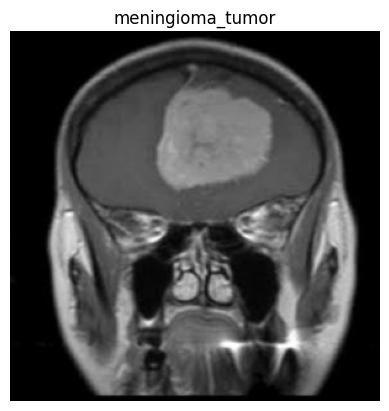

1/1 [==============================] - 0s 114ms/step
Predicted class: meningioma_tumor
------------------------


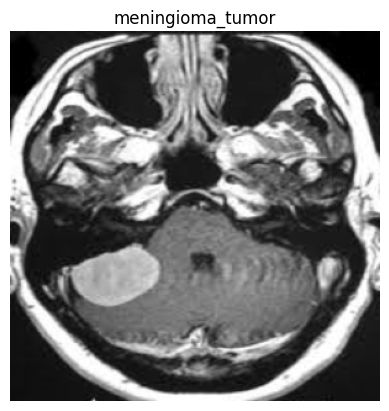

1/1 [==============================] - 0s 163ms/step
Predicted class: meningioma_tumor
------------------------


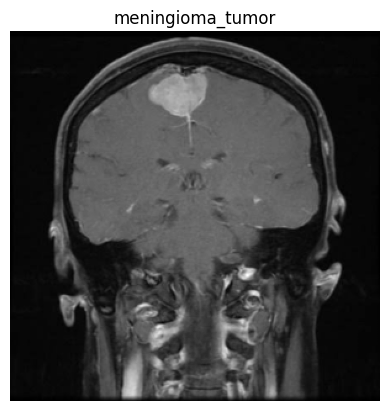

1/1 [==============================] - 0s 137ms/step
Predicted class: meningioma_tumor
------------------------


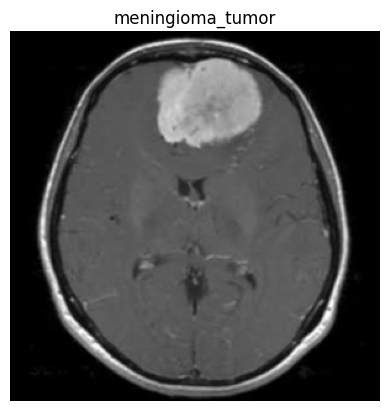

1/1 [==============================] - 0s 117ms/step
Predicted class: glioma_tumor
------------------------


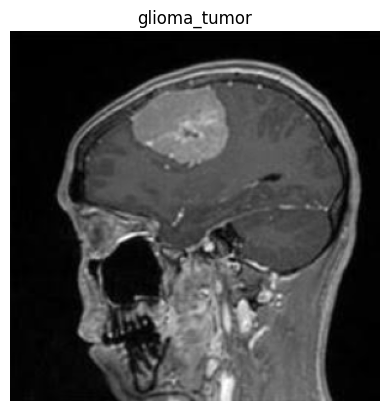

1/1 [==============================] - 0s 138ms/step
Predicted class: meningioma_tumor
------------------------


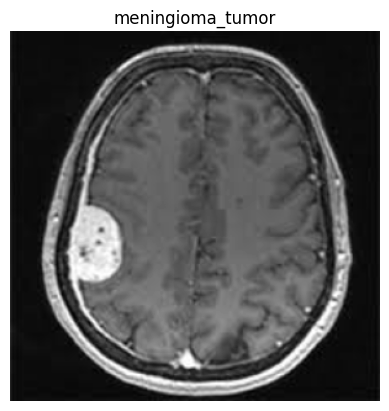

1/1 [==============================] - 0s 115ms/step
Predicted class: no_tumor
------------------------


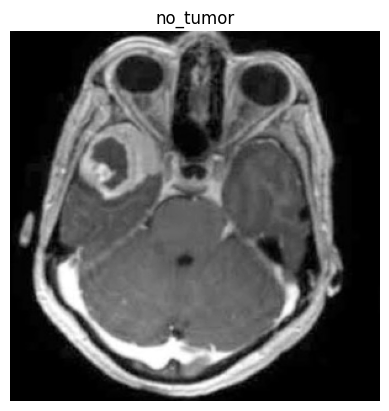

1/1 [==============================] - 0s 119ms/step
Predicted class: no_tumor
------------------------


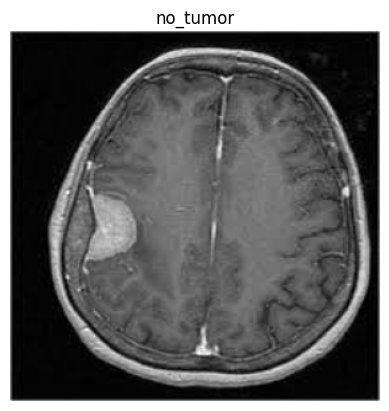

1/1 [==============================] - 0s 115ms/step
Predicted class: meningioma_tumor
------------------------


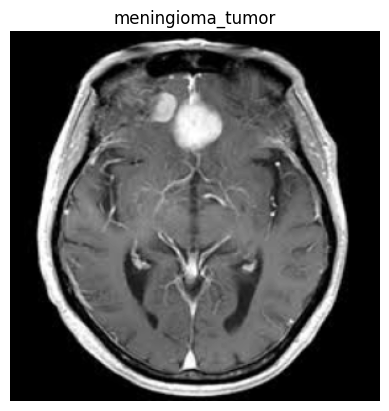

1/1 [==============================] - 0s 124ms/step
Predicted class: meningioma_tumor
------------------------


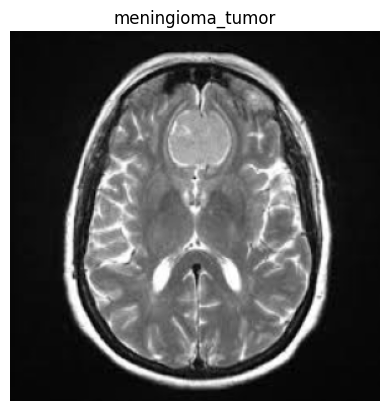

1/1 [==============================] - 0s 122ms/step
Predicted class: meningioma_tumor
------------------------


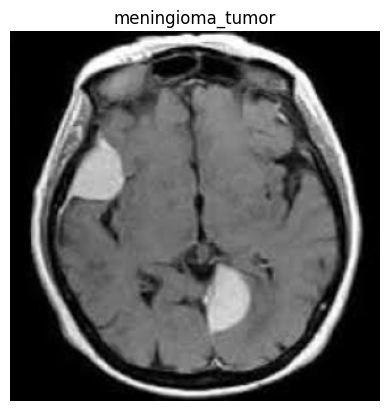

1/1 [==============================] - 0s 119ms/step
Predicted class: meningioma_tumor
------------------------


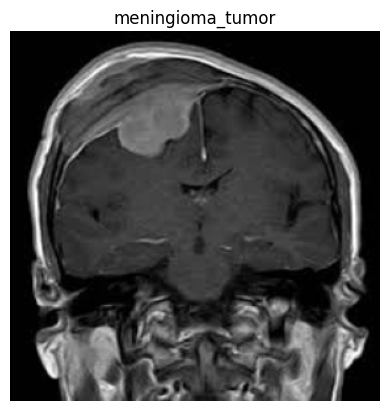

1/1 [==============================] - 0s 109ms/step
Predicted class: meningioma_tumor
------------------------


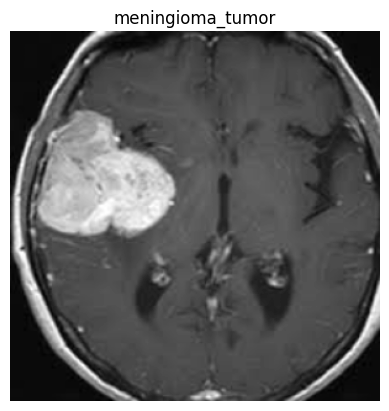

1/1 [==============================] - 0s 132ms/step
Predicted class: no_tumor
------------------------


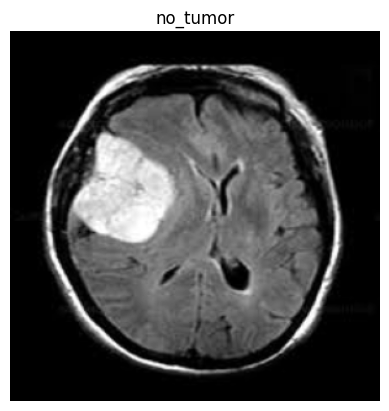

1/1 [==============================] - 0s 110ms/step
Predicted class: meningioma_tumor
------------------------


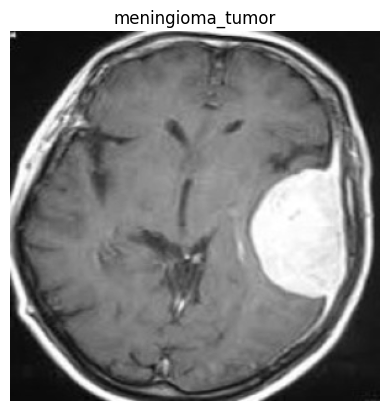

1/1 [==============================] - 0s 111ms/step
Predicted class: meningioma_tumor
------------------------


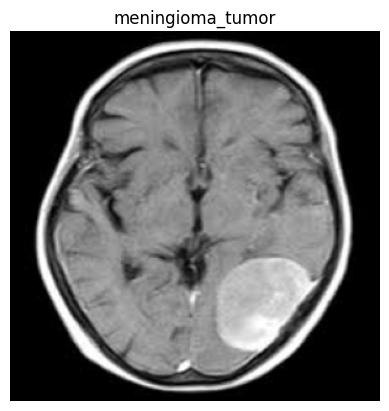

1/1 [==============================] - 0s 110ms/step
Predicted class: meningioma_tumor
------------------------


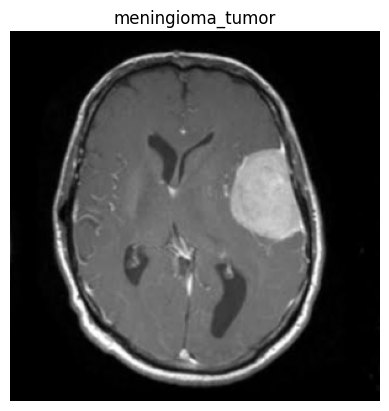

1/1 [==============================] - 0s 114ms/step
Predicted class: meningioma_tumor
------------------------


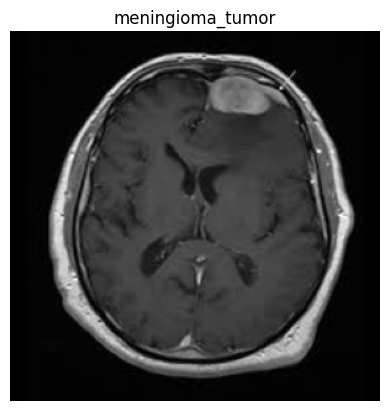

1/1 [==============================] - 0s 124ms/step
Predicted class: meningioma_tumor
------------------------


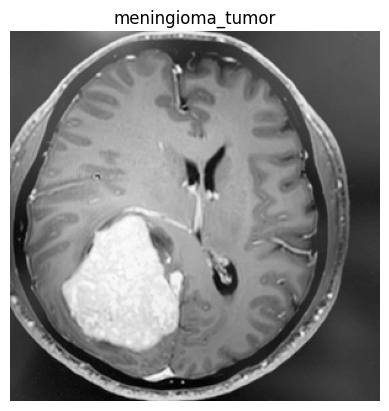

1/1 [==============================] - 0s 113ms/step
Predicted class: meningioma_tumor
------------------------


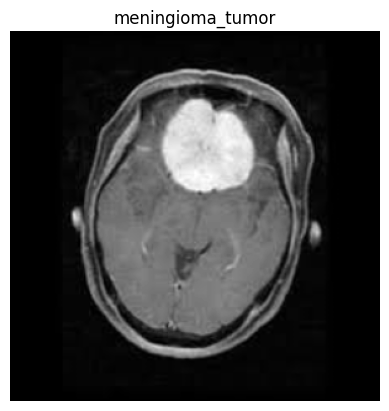

1/1 [==============================] - 0s 116ms/step
Predicted class: no_tumor
------------------------


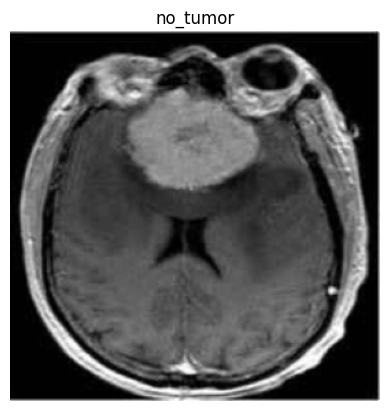

1/1 [==============================] - 0s 107ms/step
Predicted class: meningioma_tumor
------------------------


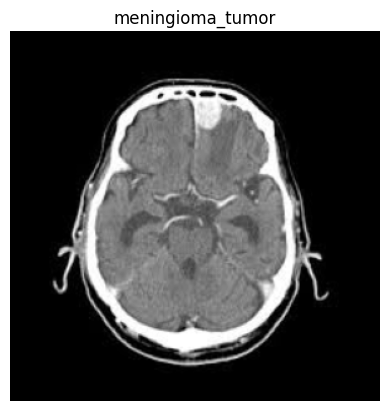

1/1 [==============================] - 0s 110ms/step
Predicted class: meningioma_tumor
------------------------


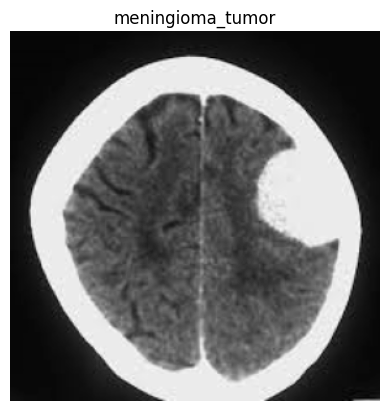

1/1 [==============================] - 0s 110ms/step
Predicted class: meningioma_tumor
------------------------


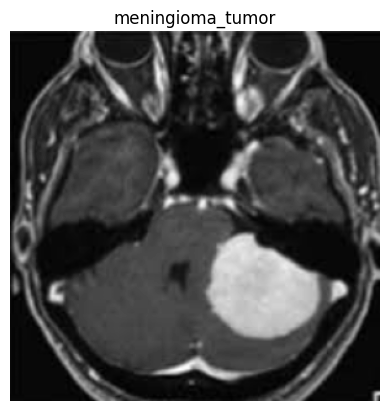

1/1 [==============================] - 0s 136ms/step
Predicted class: meningioma_tumor
------------------------


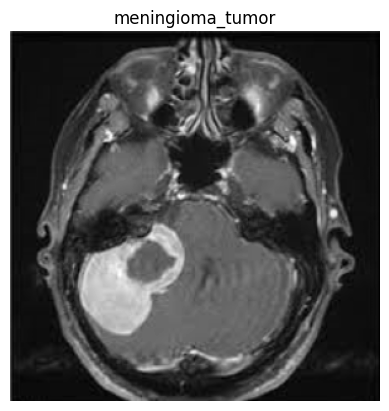

1/1 [==============================] - 0s 158ms/step
Predicted class: meningioma_tumor
------------------------


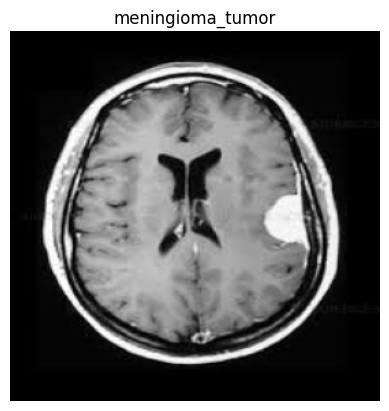

1/1 [==============================] - 0s 185ms/step
Predicted class: meningioma_tumor
------------------------


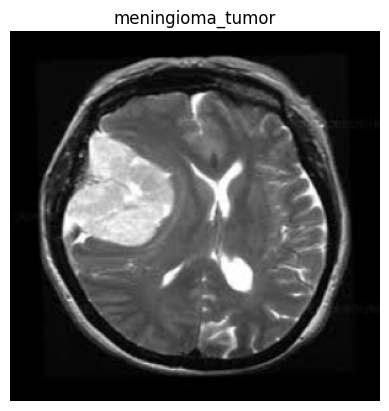

1/1 [==============================] - 0s 186ms/step
Predicted class: meningioma_tumor
------------------------


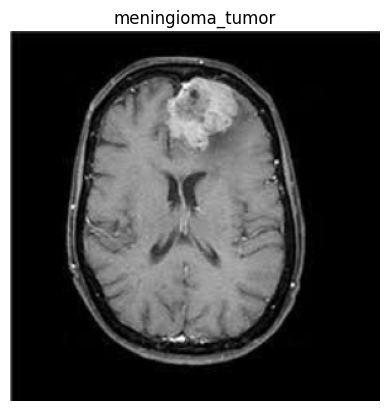

1/1 [==============================] - 0s 174ms/step
Predicted class: meningioma_tumor
------------------------


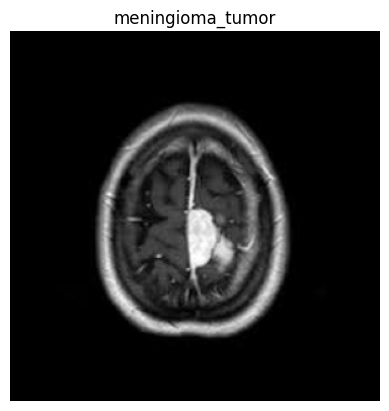

1/1 [==============================] - 0s 206ms/step
Predicted class: meningioma_tumor
------------------------


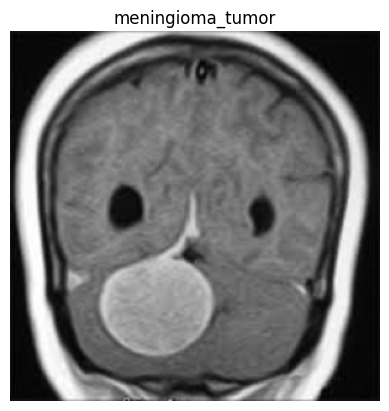

1/1 [==============================] - 0s 185ms/step
Predicted class: meningioma_tumor
------------------------


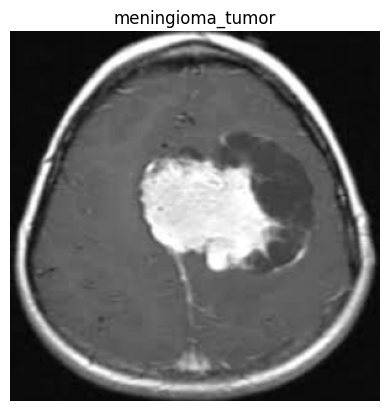

1/1 [==============================] - 0s 158ms/step
Predicted class: meningioma_tumor
------------------------


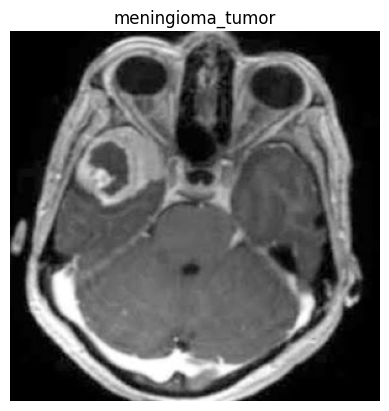

1/1 [==============================] - 0s 154ms/step
Predicted class: meningioma_tumor
------------------------


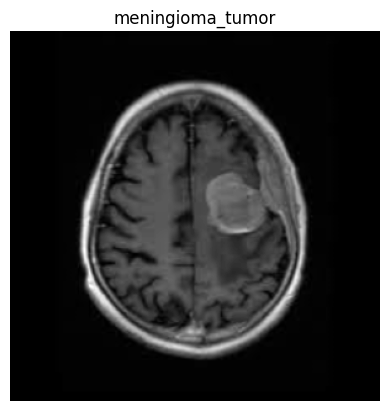

1/1 [==============================] - 0s 130ms/step
Predicted class: meningioma_tumor
------------------------


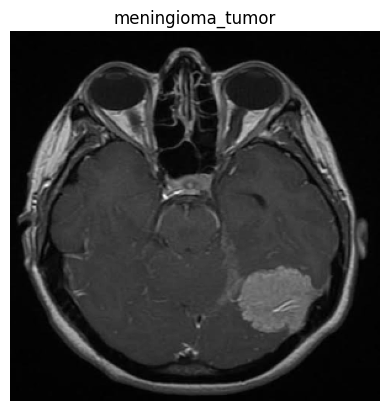

1/1 [==============================] - 0s 158ms/step
Predicted class: meningioma_tumor
------------------------


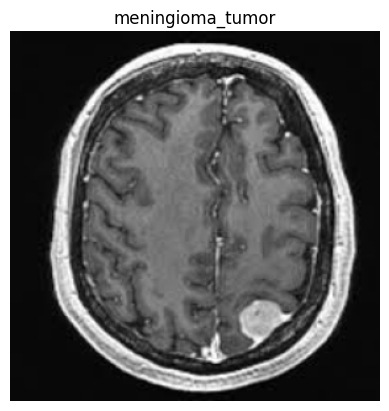

1/1 [==============================] - 0s 146ms/step
Predicted class: meningioma_tumor
------------------------


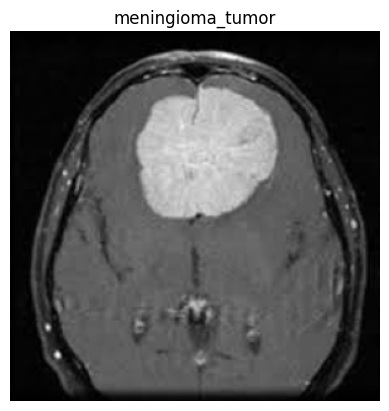

1/1 [==============================] - 0s 117ms/step
Predicted class: meningioma_tumor
------------------------


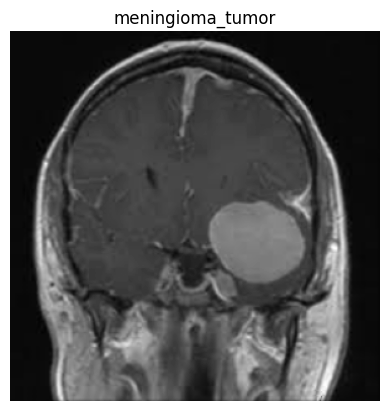

1/1 [==============================] - 0s 108ms/step
Predicted class: meningioma_tumor
------------------------


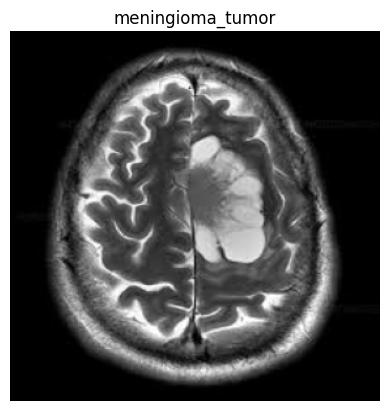

In [ ]:
import matplotlib
#test no tumor using CNN

import matplotlib.pyplot as plt


c=0
import matplotlib.pyplot as plt

folder_path = '/content/drive/MyDrive/Brain Tumor Dataset1/Testing Dataset/meningioma_tumor'

# Iterate over the images in the folder
for image_file in os.listdir(folder_path):

    # Load the test image
    image_path = os.path.join(folder_path, image_file)
    test_image = cv2.imread(image_path, 0)
    test_image = cv2.resize(test_image, (300, 300))

    # Reshape the image to match the input shape of the CNN model
    test_image = test_image.reshape((1, 300, 300, 1))
    test_image = test_image / 255.0  # Normalize the image pixel values

    # Make predictions on the test image
    predictions = model.predict(test_image)

    # Get the predicted class label
    predicted_class = np.argmax(predictions)

    # Map the predicted class label to the corresponding class name
    class_names = ['no_tumor', 'pituitary_tumor', 'meningioma_tumor', 'glioma_tumor']
    predicted_class_name = class_names[predicted_class]

    # Print the predicted class label for each image

    print('Predicted class:', predicted_class_name)
    print('------------------------')

    # Display the image
    plt.imshow(test_image.reshape(300, 300), cmap='gray')
    plt.title(f'{predicted_class_name}')
    plt.axis('off')
    plt.show()
    c+=1